# Welcome to the Notebook

# Importing modules

## Task 1

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.io as pio
pio.renderers.default = "notebook"

In [2]:
dataset_url = 'https://raw.githubusercontent.com/datasets/covid-19/master/data/countries-aggregated.csv'
df = pd.read_csv(dataset_url)
df.head() 

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
1,2020-01-23,Afghanistan,0,0,0
2,2020-01-24,Afghanistan,0,0,0
3,2020-01-25,Afghanistan,0,0,0
4,2020-01-26,Afghanistan,0,0,0


## Task 1.2:

In [3]:
df.columns

Index(['Date', 'Country', 'Confirmed', 'Recovered', 'Deaths'], dtype='object')

In [4]:
df.shape

(161568, 5)

In [5]:
df.size

807840

In [6]:
df.dtypes
# type of each column - object = string

Date         object
Country      object
Confirmed     int64
Recovered     int64
Deaths        int64
dtype: object

In [7]:
# checking for total number of values which are Null in each column
df.isna().sum()

Date         0
Country      0
Confirmed    0
Recovered    0
Deaths       0
dtype: int64

In [8]:
df.describe

<bound method NDFrame.describe of               Date      Country  Confirmed  Recovered  Deaths
0       2020-01-22  Afghanistan          0          0       0
1       2020-01-23  Afghanistan          0          0       0
2       2020-01-24  Afghanistan          0          0       0
3       2020-01-25  Afghanistan          0          0       0
4       2020-01-26  Afghanistan          0          0       0
...            ...          ...        ...        ...     ...
161563  2022-04-12     Zimbabwe     247094          0    5460
161564  2022-04-13     Zimbabwe     247160          0    5460
161565  2022-04-14     Zimbabwe     247208          0    5462
161566  2022-04-15     Zimbabwe     247237          0    5462
161567  2022-04-16     Zimbabwe     247237          0    5462

[161568 rows x 5 columns]>

In [9]:
numeric_columns = df.select_dtypes(include=[int, float])
correlation_matrix = numeric_columns.corr()
correlation_matrix

,Confirmed,Recovered,Deaths
Confirmed,1.000000,0.277797,0.914993
Recovered,0.277797,1.000000,0.318160
Deaths,0.914993,0.318160,1.000000


## Task 2.1 :
#### let's do some preprocessing 

In [10]:
# lets examine when the first Covid19 confirmed cases have been recorded in each country
df = df[df.Confirmed > 0 ]

In [11]:
# converting the object column Date to datetime format
df['Date'] = pd.to_datetime(df['Date'])
df

C:\Users\Bluthund\AppData\Local\Temp\ipykernel_21900\908838468.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,Country,Confirmed,Recovered,Deaths
33,2020-02-24,Afghanistan,5,0,0
34,2020-02-25,Afghanistan,5,0,0
35,2020-02-26,Afghanistan,5,0,0
36,2020-02-27,Afghanistan,5,0,0
37,2020-02-28,Afghanistan,5,0,0
...,...,...,...,...,...
161563,2022-04-12,Zimbabwe,247094,0,5460
161564,2022-04-13,Zimbabwe,247160,0,5460
161565,2022-04-14,Zimbabwe,247208,0,5462
161566,2022-04-15,Zimbabwe,247237,0,5462


In [12]:
# Sort the DataFrame based on the Date column
df.sort_values(by='Date', inplace=True)
df.head()


C:\Users\Bluthund\AppData\Local\Temp\ipykernel_21900\2138868304.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,Country,Confirmed,Recovered,Deaths
71808,2020-01-22,Japan,2,0,0
75888,2020-01-22,"Korea, South",1,0,0
143616,2020-01-22,Thailand,4,2,0
149328,2020-01-22,US,1,0,0
141168,2020-01-22,Taiwan*,1,0,0


#### let's see data related to a country for example Italy 


In [13]:
df[(df['Country'] == 'Italy') & (df['Confirmed'] > 0)]


,Date,Country,Confirmed,Recovered,Deaths
70185,2020-01-31,Italy,2,0,0
70186,2020-02-01,Italy,2,0,0
70187,2020-02-02,Italy,2,0,0
70188,2020-02-03,Italy,2,0,0
70189,2020-02-04,Italy,2,0,0
...,...,...,...,...,...
70987,2022-04-12,Italy,15404809,0,161032
70988,2022-04-13,Italy,15467395,0,161187
70989,2022-04-14,Italy,15533012,0,161336
70990,2022-04-15,Italy,15595302,0,161469


#### let's see Global spread of Covid19

In [14]:
# dataset_url = 'https://raw.githubusercontent.com/datasets/covid-19/master/data/countries-aggregated.csv'
# df = pd.read_csv(dataset_url)

In [15]:
fig = px.choropleth(df, locations='Country', locationmode='country names', color='Confirmed', animation_frame='Date')
fig.update_layout(title_text='Global Spread')
fig.show()

### Task 2.2 : Exercise 
#### Let's see Global deaths of Covid19

In [16]:
fig = px.choropleth(df, locations='Country', locationmode='country names', color='Deaths', animation_frame='Date')
fig.update_layout(title_text='Global Deaths of Covid-19')
fig.show()

### Task 3.1:
#### Let's Visualize how intensive the Covid19 Transmission has been in each of the country
let's start with an example:

In [17]:
df_china = df[df.Country == 'China']
df_china

,Date,Country,Confirmed,Recovered,Deaths
30192,2020-01-22,China,548,28,17
30193,2020-01-23,China,643,30,18
30194,2020-01-24,China,920,36,26
30195,2020-01-25,China,1406,39,42
30196,2020-01-26,China,2075,49,56
...,...,...,...,...,...
31003,2022-04-12,China,1655477,0,13524
31004,2022-04-13,China,1681437,0,13586
31005,2022-04-14,China,1705231,0,13640
31006,2022-04-15,China,1759128,0,13707


let's select the columns that we need

In [18]:
df_china = df_china[['Date', 'Confirmed']]
df_china.head()

,Date,Confirmed
30192,2020-01-22,548
30193,2020-01-23,643
30194,2020-01-24,920
30195,2020-01-25,1406
30196,2020-01-26,2075


We can also calculate the gain in confirmed infections we get every day (increase per day)

calculating the first derivation of confrimed column

In [19]:
# Creating a new column, Infection Rate - the rate which number of confirmed cases change
# basically the first derivation of our variable which is cumulative number of confirmed cases
df_china['Infection Rate'] = df_china['Confirmed'].diff()
df_china

C:\Users\Bluthund\AppData\Local\Temp\ipykernel_21900\3089818752.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,Confirmed,Infection Rate
30192,2020-01-22,548,NaN
30193,2020-01-23,643,95.0
30194,2020-01-24,920,277.0
30195,2020-01-25,1406,486.0
30196,2020-01-26,2075,669.0
...,...,...,...
31003,2022-04-12,1655477,24597.0
31004,2022-04-13,1681437,25960.0
31005,2022-04-14,1705231,23794.0
31006,2022-04-15,1759128,53897.0


In [20]:
px.line(df_china, x = 'Date', y = ['Confirmed', 'Infection Rate'])
 

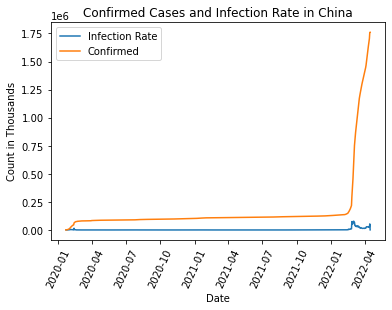

<Figure size 1440x864 with 0 Axes>

In [21]:
sns.lineplot(data=df_china, x='Date', y='Infection Rate', label='Infection Rate')
sns.lineplot(data=df_china, x='Date', y='Confirmed', label='Confirmed')


plt.xlabel('Date')
plt.ylabel('Count in Thousands')
plt.title('Confirmed Cases and Infection Rate in China')
plt.legend()
plt.xticks(rotation=65)

plt.figure(figsize=(20, 12)) 


plt.show()

In [22]:
df_china['Infection Rate'].max()

77402.0

### Task 3.2:
#### Let's Calculate Maximum infection rate for all of the countries

In [29]:
df_china.head()

,Date,Confirmed
30192,2020-01-22,548
30193,2020-01-23,643
30194,2020-01-24,920
30195,2020-01-25,1406
30196,2020-01-26,2075


In [31]:
countries = list(df['Country'])
countries

['Japan',
 'Korea, South',
 'Thailand',
 'US',
 'Taiwan*',
 'China',
 'Taiwan*',
 'Singapore',
 'US',
 'Thailand',
 'Canada',
 'Korea, South',
 'Japan',
 'China',
 'Vietnam',
 'China',
 'France',
 'Korea, South',
 'Canada',
 'Taiwan*',
 'Japan',
 'Thailand',
 'Vietnam',
 'Singapore',
 'US',
 'Thailand',
 'China',
 'Korea, South',
 'Canada',
 'Nepal',
 'US',
 'Malaysia',
 'Taiwan*',
 'Japan',
 'Vietnam',
 'Singapore',
 'France',
 'Vietnam',
 'Korea, South',
 'China',
 'Japan',
 'Taiwan*',
 'Singapore',
 'France',
 'Thailand',
 'Nepal',
 'US',
 'Australia',
 'Canada',
 'Malaysia',
 'Japan',
 'Vietnam',
 'Germany',
 'Thailand',
 'Nepal',
 'Cambodia',
 'US',
 'Sri Lanka',
 'Canada',
 'Malaysia',
 'France',
 'Taiwan*',
 'Korea, South',
 'Singapore',
 'Australia',
 'China',
 'Thailand',
 'Australia',
 'Germany',
 'Nepal',
 'China',
 'Korea, South',
 'Cambodia',
 'Canada',
 'US',
 'Malaysia',
 'Japan',
 'Sri Lanka',
 'Singapore',
 'Vietnam',
 'France',
 'Taiwan*',
 'Taiwan*',
 'Japan',
 'Kore

In [34]:
countries = list(df['Country'].unique())
countries

['Japan',
 'Korea, South',
 'Thailand',
 'US',
 'Taiwan*',
 'China',
 'Singapore',
 'Canada',
 'Vietnam',
 'France',
 'Nepal',
 'Malaysia',
 'Australia',
 'Germany',
 'Cambodia',
 'Sri Lanka',
 'United Arab Emirates',
 'Finland',
 'India',
 'Philippines',
 'Russia',
 'United Kingdom',
 'Italy',
 'Sweden',
 'Spain',
 'Belgium',
 'Diamond Princess',
 'Egypt',
 'Iran',
 'Israel',
 'Lebanon',
 'Chile',
 'Bahrain',
 'Kuwait',
 'Iraq',
 'Oman',
 'Afghanistan',
 'Switzerland',
 'Algeria',
 'Pakistan',
 'Croatia',
 'Austria',
 'Georgia',
 'Greece',
 'Romania',
 'Norway',
 'Brazil',
 'North Macedonia',
 'Netherlands',
 'Estonia',
 'Denmark',
 'Nigeria',
 'New Zealand',
 'Belarus',
 'Iceland',
 'Mexico',
 'Qatar',
 'Monaco',
 'Lithuania',
 'Luxembourg',
 'Ireland',
 'San Marino',
 'Dominican Republic',
 'Azerbaijan',
 'Czechia',
 'Armenia',
 'Ecuador',
 'Senegal',
 'Morocco',
 'Andorra',
 'Saudi Arabia',
 'Portugal',
 'Indonesia',
 'Latvia',
 'Argentina',
 'Jordan',
 'Ukraine',
 'Liechtenstein',

In [38]:
max_infection_rates = []
for country in countries:
    MIR = df[df.Country == country].Confirmed.diff().max()
    max_infection_rates.append(MIR)

max_infection_rates


[104345.0,
 621317.0,
 52284.0,
 1383795.0,
 1348.0,
 77402.0,
 39252.0,
 63808.0,
 454212.0,
 503349.0,
 10052.0,
 33406.0,
 175271.0,
 527487.0,
 1130.0,
 11366.0,
 4471.0,
 28891.0,
 414188.0,
 38867.0,
 202211.0,
 848169.0,
 228123.0,
 138985.0,
 372766.0,
 133480.0,
 99.0,
 5516.0,
 50228.0,
 243295.0,
 10760.0,
 41651.0,
 8173.0,
 6913.0,
 13515.0,
 6146.0,
 3243.0,
 89462.0,
 2521.0,
 12073.0,
 11812.0,
 58583.0,
 26320.0,
 50182.0,
 40018.0,
 26109.0,
 287149.0,
 2332.0,
 380498.0,
 8438.0,
 55709.0,
 6158.0,
 39814.0,
 8921.0,
 7408.0,
 109895.0,
 4206.0,
 520.0,
 12968.0,
 5497.0,
 43199.0,
 491.0,
 7439.0,
 7779.0,
 57378.0,
 4388.0,
 17670.0,
 1722.0,
 12039.0,
 2313.0,
 5928.0,
 75276.0,
 64718.0,
 11992.0,
 139853.0,
 25502.0,
 45022.0,
 349.0,
 45047.0,
 19923.0,
 57659.0,
 5254.0,
 37875.0,
 23332.0,
 30356.0,
 2291.0,
 35575.0,
 1002.0,
 18188.0,
 28504.0,
 9668.0,
 7.0,
 36737.0,
 99645.0,
 1677.0,
 16230.0,
 25833.0,
 12399.0,
 2838.0,
 6199.0,
 7380.0,
 4789.0,
 100

### Task 3.3:
#### let's create a new Dataframe 

In [40]:
df_MIR = pd.DataFrame()
df_MIR['Country'] = countries
df_MIR['Max Infection Rate'] = max_infection_rates
df_MIR

,Country,Max Infection Rate
0,Japan,104345.0
1,"Korea, South",621317.0
2,Thailand,52284.0
3,US,1383795.0
4,Taiwan*,1348.0
...,...,...
193,Summer Olympics 2020,112.0
194,Palau,371.0
195,Tonga,832.0
196,Antarctica,0.0


#### Let's plot the barchart : maximum infection rate of each country

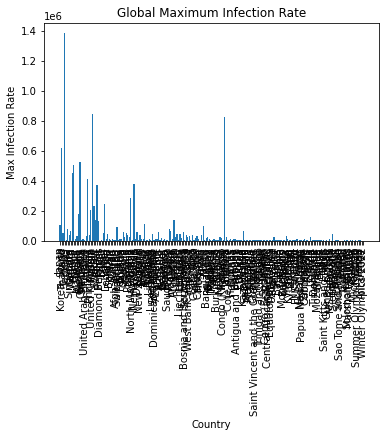

<Figure size 1296x432 with 0 Axes>

In [47]:
# Assuming 'df_MIR' is your DataFrame with columns 'Country' and 'Max Infection Rate'
plt.bar(df_MIR['Country'], df_MIR['Max Infection Rate'])


plt.xlabel('Country')
plt.ylabel('Max Infection Rate')
plt.title('Global Maximum Infection Rate')

plt.xticks(rotation=90)  # Rotate x-axis tick labels for better readability

plt.figure(figsize=(18, 6))

plt.show()

### Task 4: Let's See how National Lockdowns Impacts Covid19 transmission in Italy

### COVID19 pandemic lockdown in Italy 
On 9 March 2020, the government of Italy under Prime Minister Giuseppe Conte imposed a national quarantine, restricting the movement of the population except for necessity, work, and health circumstances, in response to the growing pandemic of COVID-19 in the country. <a href="https://en.wikipedia.org/wiki/COVID-19_pandemic_lockdown_in_Italy#:~:text=On%209%20March%202020%2C%20the,COVID%2D19%20in%20the%20country.">source</a>

In [24]:
italy_lockdown_start_date = '2020-03-09'
italy_lockdown_a_month_later = '2020-04-09'

In [25]:
df.head()

,Date,Country,Confirmed,Recovered,Deaths
71808,2020-01-22,Japan,2,0,0
75888,2020-01-22,"Korea, South",1,0,0
143616,2020-01-22,Thailand,4,2,0
149328,2020-01-22,US,1,0,0
141168,2020-01-22,Taiwan*,1,0,0


let's get data related to italy

lets check the dataframe

let's calculate the infection rate in Italy

ok! now let's do the visualization

### Task 5: Let's See how National Lockdowns Impacts Covid19 active cases in Italy

In [26]:
df_italy.head()

NameError: name 'df_italy' is not defined

let's calculate number of active cases day by day 

let's check the dataframe again

now let's plot a line chart to compare COVID19 national lockdowns impacts on spread of the virus and number of active cases

### COVID19 pandemic lockdown in Germany 
Lockdown was started in Freiburg, Baden-Württemberg and Bavaria on 20 March 2020. Three days later, it was expanded to the whole of Germany

In [ ]:
Germany_lockdown_start_date = '2020-03-23' 
Germany_lockdown_a_month_later = '2020-04-23'

let's select the data related to Germany

let's check the dataframe 

selecting the needed column

let's check it again

let's calculate the infection rate in Germany

let's check the dataframe

now let's plot the line chart

let's do some scaling

let's plot the line chart

Which option could be good measure for Describing how intensive the spread of the virus has been in country?

- Maximum number of new infected cases in every 24 hours, over our time perdiod

Normalization:

- To Scale a variable to have values between 0 and 1

To get first derivative in pandas use:

- diff()

To log scale the Y axis in plotly use:

- log_y = True

When do we apply scaling to an axis in data visualization?

- when we cannot see enough details about an axis


